# Assignment

**Create Panorama image**

**Instruction : This section you need to create 1 panorama from 3 pier images.**

In [1]:
#1st image : peir_1.jpg
!gdown "1Gstc-9xF_3s7jB6uwB4tHzsUVY2usv0k"

#2st image : peir_2.jpg
!gdown "1mPucyctY8YJOQlxzp3yZwM1NhMC--fPN"

#3st image : peir_3.jpg
!gdown "1qLRpmiTVx96DwAjGNP0580cb8yJ0GA44"

Downloading...
From: https://drive.google.com/uc?id=1Gstc-9xF_3s7jB6uwB4tHzsUVY2usv0k
To: /content/pier_1.JPG
100% 122k/122k [00:00<00:00, 12.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1mPucyctY8YJOQlxzp3yZwM1NhMC--fPN
To: /content/pier_2.JPG
100% 116k/116k [00:00<00:00, 69.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1qLRpmiTVx96DwAjGNP0580cb8yJ0GA44
To: /content/pier_3.JPG
100% 120k/120k [00:00<00:00, 42.5MB/s]


In [180]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

In [181]:
def display_images(images):

    #Check that image is list type or not.
    if not isinstance(images, list):
        #If not list type
        figure(figsize=(12, 12))
        plt.imshow(cv2.cvtColor(images, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
        plt.axis('off')
        return

    n = len(images)
    cols = int(np.ceil(np.sqrt(n)))
    rows = int(np.ceil(n / cols))
    print("n = ",n)
    print("cols = ",cols)
    print("rows = ",rows)

    fig, axes = plt.subplots(rows, cols, figsize=(12, 12))
    print("axes before: ",len(axes))
    axes = axes.flatten()  # Flatten the axes array for easier indexing
    print("axes after: ",len(axes))

    for i in range(n):
        axes[i].imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
        axes[i].axis('off') #hide axis


    # Hide any unused subplots
    for j in range(i + 1, rows * cols):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

In [254]:
pier1 = cv2.imread('pier_1.JPG')
pier2 = cv2.imread('pier_2.JPG')
pier3 = cv2.imread('pier_3.JPG')

n =  3
cols =  2
rows =  2
axes before:  2
axes after:  4


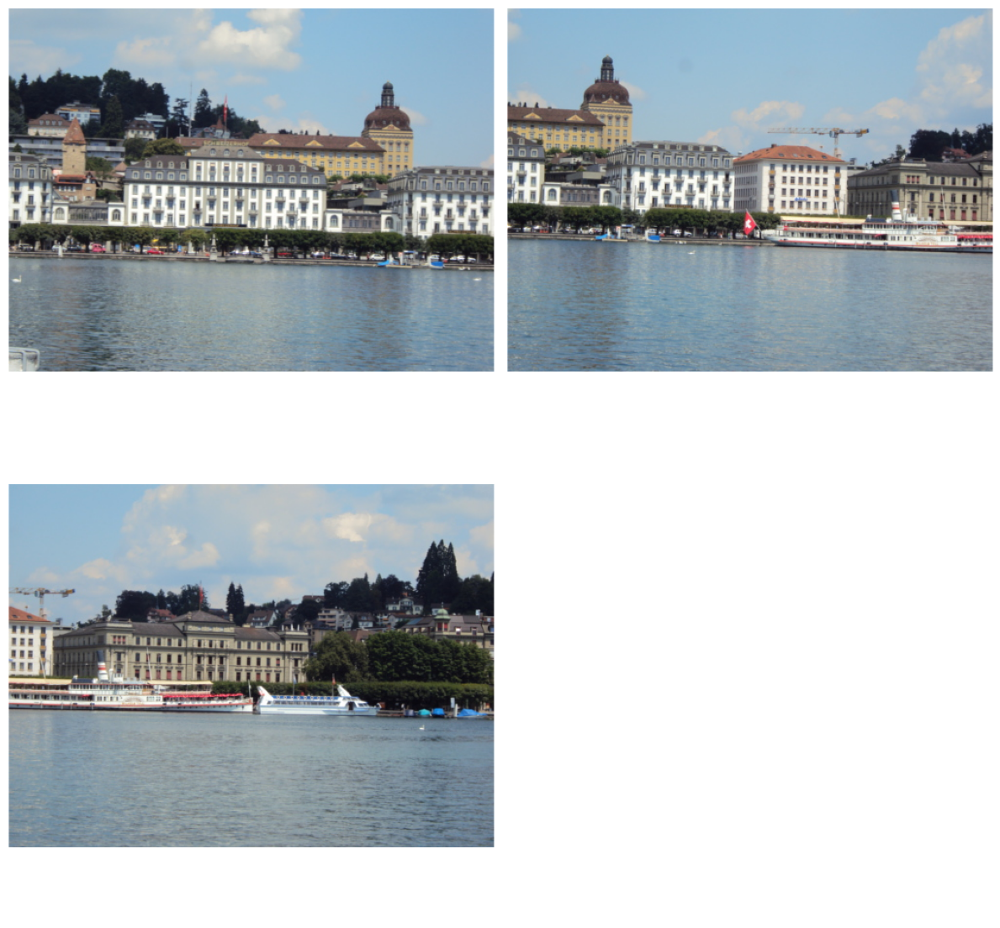

In [255]:
display_images([pier1,pier2,pier3])

In [256]:
# Create SIFT object
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
keypoints1, descriptors1 = sift.detectAndCompute(pier1, None)
keypoints2, descriptors2 = sift.detectAndCompute(pier2, None)
keypoints3, descriptors3 = sift.detectAndCompute(pier3, None)

In [257]:
keypoints_drawn_left = cv2.drawKeypoints(pier1, keypoints1, None, color=(0, 0, 255))
keypoints_drawn_right = cv2.drawKeypoints(pier2, keypoints2, None, color=(0, 0, 255))

array([[[229, 234, 238],
        [208, 213, 217],
        [209, 216, 222],
        ...,
        [195, 214, 231],
        [196, 212, 227],
        [229, 238, 247]],

       [[200, 214, 223],
        [173, 187, 196],
        [169, 186, 196],
        ...,
        [151, 179, 201],
        [155, 180, 200],
        [205, 221, 236]],

       [[203, 217, 226],
        [170, 184, 193],
        [166, 184, 194],
        ...,
        [146, 180, 208],
        [148, 178, 204],
        [204, 225, 242]],

       ...,

       [[235, 237, 232],
        [219, 221, 216],
        [219, 222, 215],
        ...,
        [119, 137, 151],
        [122, 138, 151],
        [193, 203, 212]],

       [[236, 238, 235],
        [220, 222, 219],
        [220, 222, 217],
        ...,
        [133, 155, 168],
        [132, 150, 162],
        [196, 209, 217]],

       [[235, 238, 231],
        [220, 222, 217],
        [218, 220, 215],
        ...,
        [119, 144, 166],
        [120, 141, 160],
        [191, 204, 220]]], dtype=uint8)
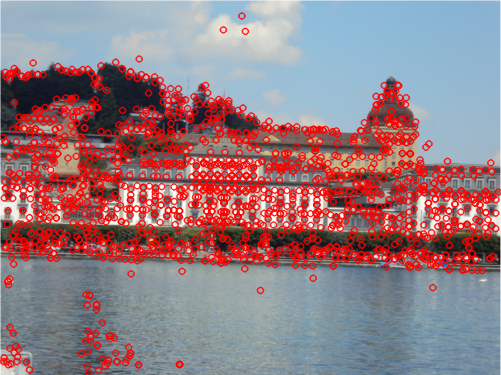

In [186]:
cv2.cvtColor(keypoints_drawn_left, cv2.COLOR_BGR2RGB)

array([[[236, 237, 241],
        [218, 219, 223],
        [216, 220, 219],
        ...,
        [204, 214, 223],
        [206, 213, 223],
        [230, 237, 243]],

       [[210, 220, 222],
        [187, 197, 199],
        [181, 195, 195],
        ...,
        [169, 183, 194],
        [174, 184, 196],
        [214, 224, 233]],

       [[214, 224, 225],
        [186, 198, 198],
        [179, 193, 194],
        ...,
        [168, 184, 197],
        [171, 183, 197],
        [217, 227, 237]],

       ...,

       [[176, 191, 198],
        [124, 141, 151],
        [116, 135, 149],
        ...,
        [123, 134, 140],
        [125, 133, 136],
        [197, 205, 207]],

       [[168, 190, 203],
        [112, 135, 151],
        [103, 130, 149],
        ...,
        [139, 148, 153],
        [144, 152, 155],
        [205, 213, 215]],

       [[165, 182, 198],
        [107, 126, 143],
        [105, 125, 149],
        ...,
        [139, 148, 155],
        [145, 152, 160],
        [204, 212, 215]]], dtype=uint8)
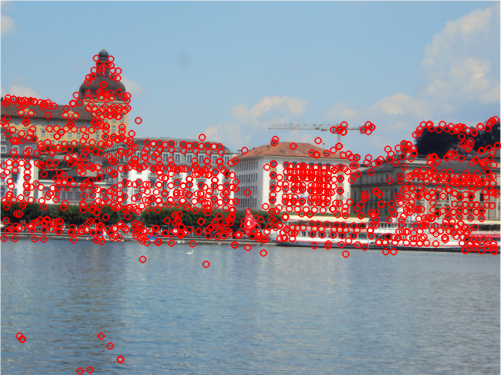

In [187]:
cv2.cvtColor(keypoints_drawn_right, cv2.COLOR_BGR2RGB)

In [258]:
# Create BFMatcher object
#1st params = distance measurement"cv.NORM_L2".
#2nd param = crossCheck which is false by default.
bf = cv2.BFMatcher()

# Match descriptors
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

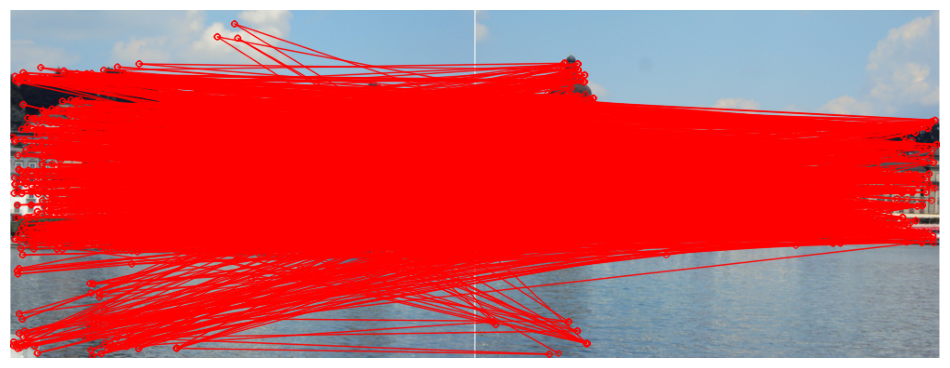

In [259]:
# Draw only matches for single point won't show
img_matches = cv2.drawMatchesKnn(pier1, keypoints1, pier2, keypoints2, matches, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
# Display the matches
display_images(img_matches)

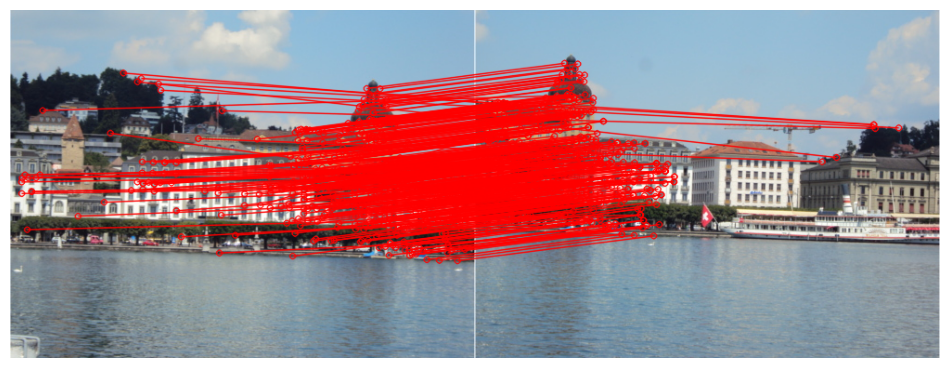

In [260]:
good_matches = []
for m, n in matches:
  if m.distance < 0.75 * n.distance:
    good_matches.append([m])

# Draw matches
img_matches = cv2.drawMatchesKnn(pier1, keypoints1, pier2, keypoints2, good_matches, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches

display_images(img_matches)

## Create Mask & Blending_smoothing Function

In [261]:
def create_mask(query_image, train_image, version):
        smoothing_window_percent = 0.10 # consider increasing or decreasing[0.00, 1.00]
        width_query_photo = query_image.shape[1]
        width_train_photo = train_image.shape[1]
        lowest_width = min(width_query_photo, width_train_photo)
        smoothing_window_size = max(100, min(smoothing_window_percent * lowest_width, 1000))

        height_query_photo = query_image.shape[0]
        height_panorama = height_query_photo
        width_panorama = width_query_photo + width_train_photo

        offset = int(smoothing_window_size / 2)
        barrier = query_image.shape[1] - int(smoothing_window_size / 2)
        mask = np.zeros((height_panorama, width_panorama))
        if version == "left_image":
            mask[:, barrier - offset : barrier + offset] = np.tile(
                np.linspace(1, 0, 2 * offset).T, (height_panorama, 1)
            )
            mask[:, : barrier - offset] = 1
        else:
            mask[:, barrier - offset : barrier + offset] = np.tile(
                np.linspace(0, 1, 2 * offset).T, (height_panorama, 1)
            )
            mask[:, barrier + offset :] = 1
        return cv2.merge([mask, mask, mask])

In [262]:
def blending_smoothing(query_image, train_image, homography_matrix):
        height_img1 = query_image.shape[0]
        width_img1 = query_image.shape[1]
        width_img2 = train_image.shape[1]
        height_panorama = height_img1
        width_panorama = width_img1 + width_img2

        panorama1 = np.zeros((height_panorama, width_panorama, 3))
        mask1 = create_mask(query_image, train_image, version="left_image")
        panorama1[0 : query_image.shape[0], 0 : query_image.shape[1], :] = query_image
        panorama1 *= mask1
        mask2 = create_mask(query_image, train_image, version="right_image")
        panorama2 = (
            cv2.warpPerspective(
                train_image, homography_matrix, (width_panorama, height_panorama)
            )
            * mask2
        )
        result = panorama1 + panorama2

        # remove extra blackspace
        rows, cols = np.where(result[:, :, 0] != 0)
        min_row, max_row = min(rows), max(rows) + 1
        min_col, max_col = min(cols), max(cols) + 1

        final_result = result[min_row:max_row, min_col:max_col, :]

        return final_result

In [264]:
# Extract the matched keypoints
# Each keypoint contains a .pt attribute, which stores the (x, y) coordinates of the keypoint.
src_pts = np.float32([ keypoints1[m[0].queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints2[m[0].trainIdx].pt for m in good_matches ]).reshape(-1,1,2)

# Apply RANSAC algorithm to remove outliers
#H = homography matrix (is ​​the relationship of pixel positions between two images.)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Filter the good matches using the RANSAC mask
good_matches_ransac = [good_matches[i] for i in range(len(good_matches)) if mask[i]]

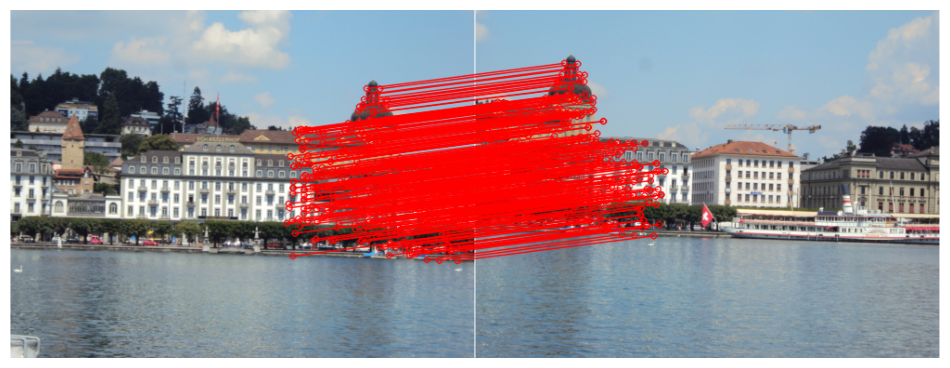

In [265]:
# Draw matches
img_matches = cv2.drawMatchesKnn(pier1, keypoints1, pier2, keypoints2, good_matches_ransac, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches

display_images(img_matches)

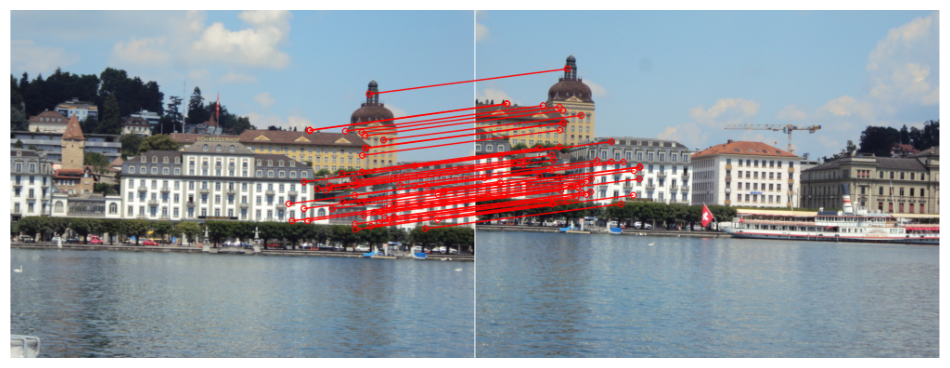

In [266]:
limit = 50
good_matches_ransac_top = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]
# Draw matches
img_matches = cv2.drawMatchesKnn(pier1, keypoints1, pier2, keypoints2, good_matches_ransac_top, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches
#
display_images(img_matches)

## Perspective transformation and finalization

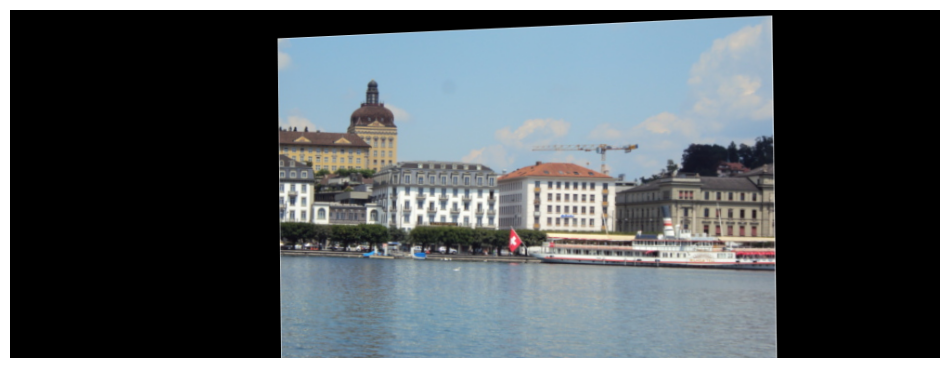

In [267]:
selected_good_matches=good_matches_ransac_top

src_pts = np.float32([ keypoints1[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints2[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))
result = blending_smoothing(pier1, pier2, H)
result_fin = np.uint8(result)


dim_x = pier1.shape[1] + pier2.shape[1]
dim_y = max(pier1.shape[0], pier2.shape[0])
dim = (dim_x, dim_y)

warped = cv2.warpPerspective(pier2, H, dim)
display_images(warped)

In [268]:
print(pier1.shape)
print(pier2.shape)

(375, 501, 3)
(375, 501, 3)


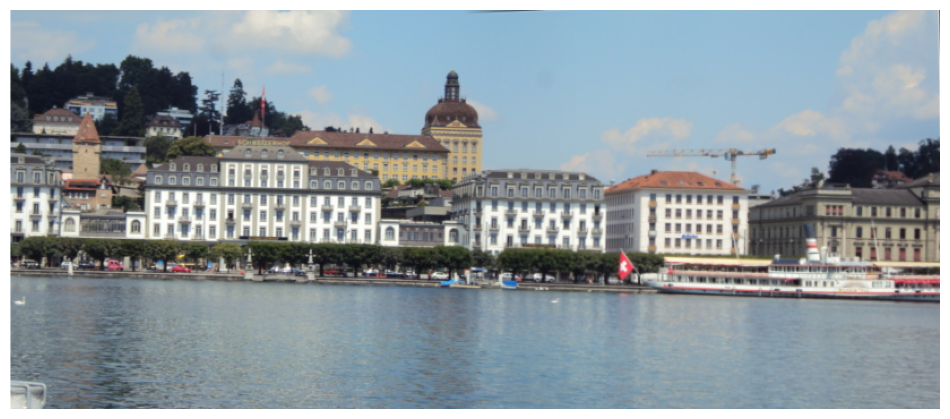

In [291]:
comb = result_fin.copy()
# combine the two images
# comb[0:pier1.shape[0],0:pier1.shape[1]] = pier1
# crop
y_crop = 822 #1920
x_crop = 375
comb = comb[22:x_crop, :y_crop]
display_images(comb)

## Combination blending into pier3

In [271]:
keypoints_comb, descriptors_comb = sift.detectAndCompute(comb, None)

In [272]:
keypoints_drawn_left = cv2.drawKeypoints(comb, keypoints_comb, None, color=(0, 0, 255))
keypoints_drawn_right = cv2.drawKeypoints(pier3, keypoints3, None, color=(0, 0, 255))

array([[[196, 212, 227],
        [160, 177, 193],
        [153, 178, 198],
        ...,
        [177, 187, 196],
        [204, 212, 219],
        [109, 113, 116]],

       [[196, 212, 227],
        [158, 177, 192],
        [153, 178, 198],
        ...,
        [177, 186, 195],
        [203, 212, 220],
        [109, 113, 116]],

       [[195, 213, 227],
        [159, 178, 193],
        [153, 180, 197],
        ...,
        [176, 186, 195],
        [202, 211, 218],
        [109, 113, 116]],

       ...,

       [[235, 237, 232],
        [219, 221, 216],
        [219, 222, 215],
        ...,
        [142, 155, 163],
        [143, 157, 162],
        [145, 158, 161]],

       [[236, 238, 235],
        [220, 222, 219],
        [220, 222, 217],
        ...,
        [139, 151, 165],
        [140, 153, 164],
        [143, 156, 165]],

       [[235, 238, 231],
        [220, 222, 217],
        [218, 220, 215],
        ...,
        [135, 145, 154],
        [130, 141, 152],
        [131, 142, 153]]], dtype=uint8)
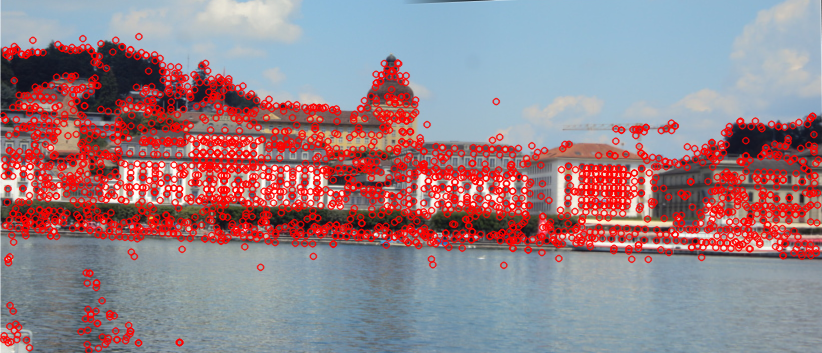

In [273]:
cv2.cvtColor(keypoints_drawn_left, cv2.COLOR_BGR2RGB)

array([[[215, 232, 242],
        [192, 210, 224],
        [191, 214, 230],
        ...,
        [203, 217, 228],
        [205, 215, 227],
        [231, 238, 244]],

       [[181, 213, 234],
        [145, 179, 204],
        [138, 180, 205],
        ...,
        [168, 188, 199],
        [170, 188, 200],
        [212, 225, 231]],

       [[188, 214, 237],
        [147, 177, 203],
        [140, 177, 204],
        ...,
        [167, 189, 202],
        [168, 186, 200],
        [216, 229, 237]],

       ...,

       [[167, 188, 207],
        [114, 136, 157],
        [111, 136, 158],
        ...,
        [ 93, 110, 126],
        [ 96, 110, 123],
        [184, 194, 203]],

       [[168, 188, 199],
        [118, 137, 152],
        [115, 138, 156],
        ...,
        [ 99, 116, 132],
        [ 99, 113, 126],
        [187, 196, 205]],

       [[180, 193, 201],
        [131, 144, 153],
        [129, 145, 158],
        ...,
        [104, 129, 149],
        [102, 123, 140],
        [183, 199, 212]]], dtype=uint8)
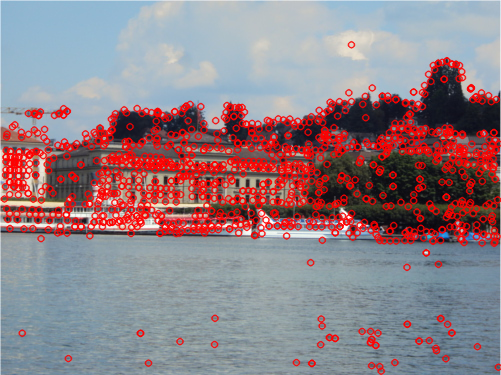

In [274]:
cv2.cvtColor(keypoints_drawn_right, cv2.COLOR_BGR2RGB)

In [275]:
bf = cv2.BFMatcher()

# Match descriptors
matches = bf.knnMatch(descriptors_comb, descriptors3, k=2)

In [276]:
comb.shape

(353, 822, 3)

In [277]:
pier3 = pier3[:353,:]

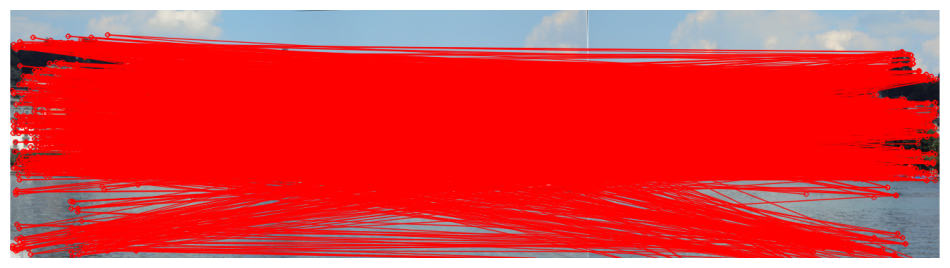

In [278]:
img_matches = cv2.drawMatchesKnn(comb, keypoints_comb, pier3, keypoints3, matches, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches
display_images(img_matches)

In [279]:
good_matches = []
for m, n in matches:
  if m.distance < 0.75 * n.distance:
    good_matches.append([m])

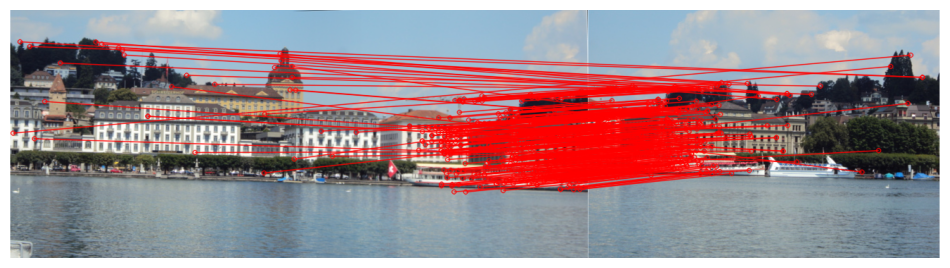

In [280]:
img_matches = cv2.drawMatchesKnn(comb, keypoints_comb, pier3, keypoints3, good_matches, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches

display_images(img_matches)

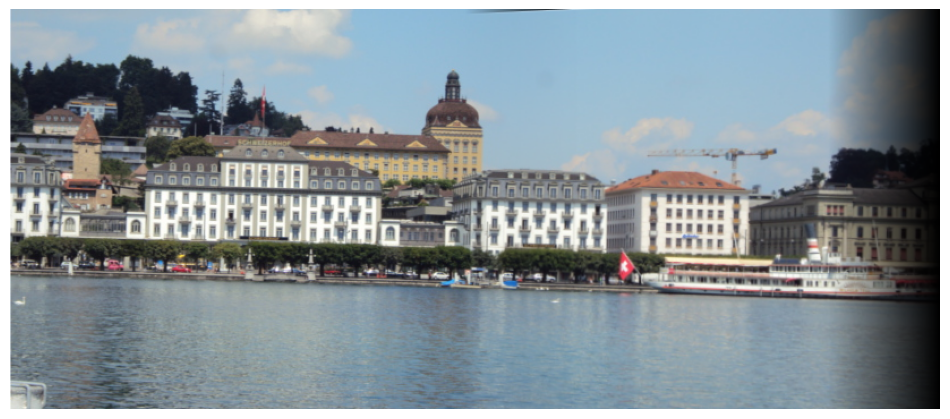

In [281]:
# Extract the matched keypoints
# Each keypoint contains a .pt attribute, which stores the (x, y) coordinates of the keypoint.
src_pts = np.float32([ keypoints_comb[m[0].queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints3[m[0].trainIdx].pt for m in good_matches ]).reshape(-1,1,2)

# Apply RANSAC algorithm to remove outliers
#H = homography matrix (is ​​the relationship of pixel positions between two images.)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

result2 = blending_smoothing(comb, pier3, H)
result_fin2 = np.uint8(result2)
display_images(result_fin2)

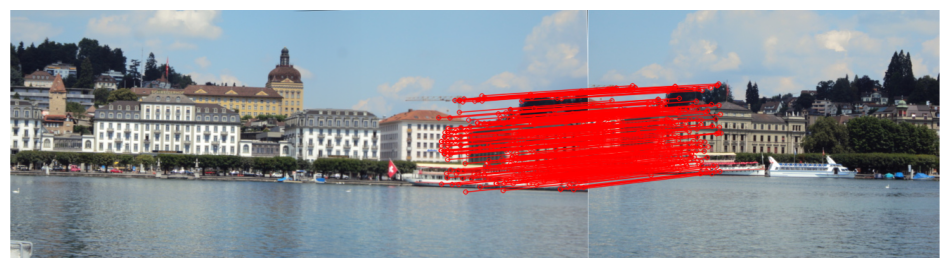

In [282]:
# Filter the good matches using the RANSAC mask
good_matches_ransac = [good_matches[i] for i in range(len(good_matches)) if mask[i]]

# Draw matches
img_matches = cv2.drawMatchesKnn(comb, keypoints_comb, pier3, keypoints3, good_matches_ransac, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches

display_images(img_matches)

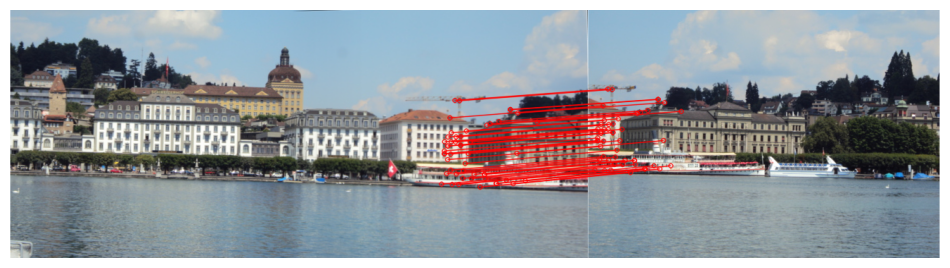

In [283]:
limit = 50
good_matches_ransac_top = sorted(good_matches_ransac, key = lambda x:x[0].distance)[:limit]
# Draw matches
img_matches = cv2.drawMatchesKnn(comb, keypoints_comb, pier3, keypoints3, good_matches_ransac_top, None, matchColor=(0,0,255), flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the matches
#
display_images(img_matches)

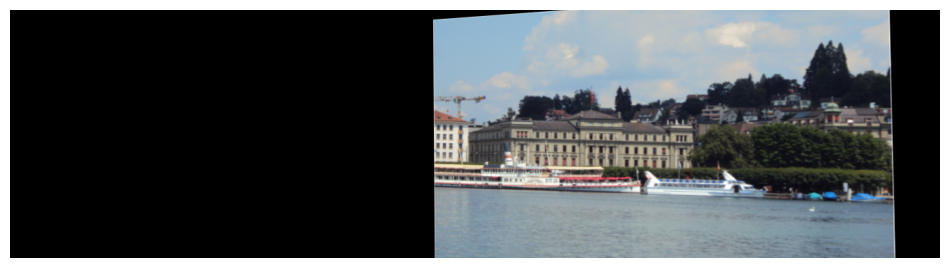

In [284]:
selected_good_matches=good_matches_ransac_top
# selected_good_matches=good_matches_ransac
src_pts = np.float32([ keypoints_comb[m[0].queryIdx].pt for m in selected_good_matches]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints3[m[0].trainIdx].pt for m in selected_good_matches]).reshape(-1,1,2)

H, _ = cv2.findHomography(np.float32(dst_pts), np.float32(src_pts))
result2 = blending_smoothing(comb, pier3, H)
result_fin2 = np.uint8(result2)

dim_x = comb.shape[1] + pier3.shape[1]
dim_y = max(comb.shape[0], pier3.shape[0])
dim = (dim_x, dim_y)

warped = cv2.warpPerspective(pier3, H, dim)
display_images(warped)

In [285]:
print(comb.shape)
print(pier3.shape)

(353, 822, 3)
(353, 501, 3)


## Final Result

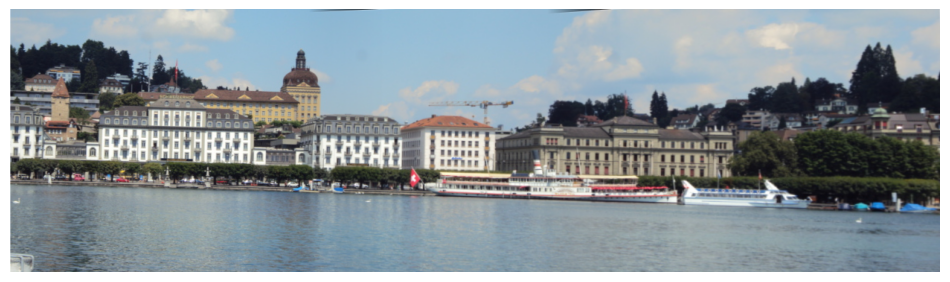

In [288]:
comb2 = result_fin2.copy()
# combine the two images
# comb2[0:comb.shape[0],0:comb.shape[1]] = comb
# crop
y_crop = 1250 #1920
x_crop = 365
comb2 = comb2[:x_crop, :y_crop]
display_images(comb2)